In [1]:
%load_ext autoreload
%autoreload 2
import sys
print(sys.executable)
import sklearn.preprocessing as pre, scipy, numpy as np, matplotlib.pyplot as plt, glob, pickle, pyemma as py, sys, os
import pandas as pd
import seaborn as sns 
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]= "2"
%matplotlib inline
from temp_tf_load import *
sys.path.append('../')
from hde import HDE, analysis
lag_time = 10
import warnings
warnings.filterwarnings('ignore')

print(tf.__version__)
print(py.__version__)



/home/mikejones/anaconda3/bin/python


/home/mikejones/anaconda3/lib/python3.7/site-packages/pyemma/__init__.py:92: UserWarning: You are not using the latest release of PyEMMA. Latest is 2.5.7, you have 2.5.6.
  .format(latest=latest, current=current), category=UserWarning)


Using TensorFlow backend.


1.14.0
2.5.6


In [2]:
tf.__version__

'1.14.0'

In [1]:
# load thermo and pairwise distance features seperately
# only pwd features are used to train the model, thermo are for plotting

#thermo_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/thermo-2831-1000-10.npy')
#pwd_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/pwdr-2831-1000-190.npy')[:1500]
#pwd_features = np.load('/home/mikejones/scratch-midway2/srv/dna_data/mdtraj-pwdr-AT-all-T-296K-10-800000-190.npy')

AT_all = np.load('/home/mikejones/scratch-midway2/srv/dna_data/mdtraj-pwdr-AT-all-T-296K-10-800000-190.npy')
GC_end = np.load('/home/mikejones/scratch-midway2/srv/dna_data/mdtraj-pwdr-GC-end-304K-10-800000-190.npy')
GC_mid = np.load('/home/mikejones/scratch-midway2/srv/dna_data/mdtraj-pwdr-GC-mid-310K-10-800000-190.npy')
GC_core = np.load('/home/mikejones/scratch-midway2/srv/dna_data/mdtraj-pwdr-GC-core-312K-10-800000-190.npy')

pwd_features = np.concatenate((AT_all, GC_end, GC_mid, GC_core), axis=0)

#skip_ts = 10
#pwd_features = pwd_features[:, ::skip_ts, :]

scaler = pre.MinMaxScaler(feature_range=(-1, 1))

#scaler.fit(np.concatenate(thermo_features))
#thermo_features_s = [scaler.transform(item) for item in thermo_features]

scaler.fit(np.concatenate(pwd_features))
pwd_features_s = [scaler.transform(item) for item in pwd_features]

#print(np.shape(thermo_features))
print(np.shape(pwd_features))


NameError: name 'np' is not defined

In [4]:
print(np.size(pwd_features))
print(np.size(np.concatenate(pwd_features)))

1520000000
1520000000


## HDE

In [8]:
skip = 10
from keras.callbacks import EarlyStopping
earlyStopping = EarlyStopping(monitor='val_loss', patience=30, verbose=1, mode='min', restore_best_weights=True)

n_sm = 4 

hde = HDE(190, n_components=n_sm, lag_time=lag_time // skip, dropout_rate=0, batch_size=500000, n_epochs=10, 
          validation_split=0.2, batch_normalization=True, learning_rate = 0.01,
          callbacks=[earlyStopping])


In [9]:
# hde.r_degree = 10    # pre-training, to speed up discovery of first few slowest modes
# hde.batch_size = 200000
# hde.n_epochs = 50
# hde.fit(pairwise_dis_s)
# hde._recompile = True
# hde.r_degree = 5
# hde.fit(pairwise_dis_s)
# hde.batch_size = 500000
# hde._recompile = True
# hde.r_degree = 2
# hde.n_epochs = 100
# hde.fit(pairwise_dis_s)

In [ ]:
hde.r_degree = 2
hde.n_epochs = 100
hde.fit(np.concatenate(pwd_features))


Instructions for updating:
Use `tf.cast` instead.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 6399999 samples, validate on 1600000 samples
Epoch 1/100
6399999/6399999 [==============================] - 36s 6us/step - loss: -4.1398 - val_loss: -4.7303
Epoch 2/100
6399999/6399999 [==============================] - 29s 5us/step - loss: -4.7555 - val_loss: -4.7714
Epoch 3/100
6399999/6399999 [==============================] - 30s 5us/step - loss: -4.7785 - val_loss: -4.7832
Epoch 4/100
6399999/6399999 [==============================] - 30s 5us/step - loss: -4.7848 - val_loss: -4.7865
Epoch 5/100
6399999/6399999 [==============================] - 30s 5us/step - loss: -4.7875 - val_loss: -4.7887
Epoch 6/100
6399999/6399999 [==============================] - 31s 5us/step - loss: -4.7897 - val_loss: -4.7908
Epoch 7/100
6399999/6399999 [==============================] - 30s 5us/step - loss: -4.7915 - val_loss: -4.7923
Epoch 8/100
63999

In [8]:
hde_coords = [hde.transform(item) for item in pwd_features]
hde_timescales = hde.timescales_
print(hde_timescales)

[352.66186006 331.93690485 322.94180654 308.14287437 296.74325059
 238.04869856]


In [9]:
## make pandas data frame

skip = 10000    #num coords to skip on plot
num_bp = 10

print (np.shape(hde_coords))
print (np.shape(pwd_features))

hde_coords_conc = np.concatenate(hde_coords)[::skip]
pwd_features_conc = np.concatenate(pwd_features)[::skip]

index_size = len(hde_coords_conc[:, 0])

print (np.shape(hde_coords_conc))
print (np.shape(pwd_features_conc))


hde_col_list = ['1st_EF', '2nd_EF', '3rd_EF', '4th_EF', '5th_EF', '6th_EF', '7th_EF']
df = pd.DataFrame(data    = hde_coords_conc, 
                  columns = hde_col_list[:n_sm],
                  index   = np.linspace(1, index_size, index_size))

#dict shows which indices need to be averaged in order to form their corresponding features
bp_match_dict  =  {'inter_ends':[9, 90],
                   'inter_cores':[45, 54],
                   'inter_all':[i*9 for i in range (num_bp)],
                   'intra_ends':[136, 181],
                   'intra_end_to_core':[110, 140, 155, 185]}


#adds each mean calculation to the dataframe where the dict key becomes the col name
for key in bp_match_dict:
    mean_vec = np.mean(pwd_features_conc[:, bp_match_dict[key]], axis=1)
    df[key] = mean_vec

    
'''

df_thermo =  pd.DataFrame(data    = thermo_features_conc, 
                   columns = feature_col_list, 
                   index   = np.linspace(1, index_size, index_size))

df = df_hde.join(df_thermo)
df = df.join(df_bp)

'''

print(df.head())

(1500, 1000, 6)
(1500, 1000, 190)
(3000, 6)
(3000, 190)
       1st_EF    2nd_EF    3rd_EF    4th_EF    5th_EF    6th_EF  inter_ends  \
1.0  0.713902 -2.305001  1.073694  0.153418 -0.349281  1.377524    0.085948   
2.0 -0.153205 -1.032746  0.012289 -0.106404 -0.316078  1.486423    0.053342   
3.0  0.531440  1.051214 -0.227888  0.397093 -8.421565 -2.168125    0.060480   
4.0  0.215385  1.460829  0.450053  0.107836 -0.688227  1.052276    0.042939   
5.0  0.776662 -0.052811  0.588479  0.522539  0.544887 -1.510864    0.137991   

     inter_cores  inter_all  intra_ends  intra_end_to_core  
1.0     0.152174   0.109727    0.033590           0.053868  
2.0     0.044106   0.063471    0.030138           0.050079  
3.0     0.121776   0.093878    0.031976           0.052241  
4.0     0.095212   0.073071    0.029880           0.049400  
5.0     0.169470   0.149672    0.034084           0.055940  


In [9]:
## unpick df when run on cluster

pkl_path = './dataframe_outputs/dummy.pkl'
df = pd.read_pickle(pkl_path)

num_bp = 10
hde_col_list = ['1st_EF', '2nd_EF', '3rd_EF', '4th_EF', '5th_EF', '6th_EF', '7th_EF']
bp_match_dict  =  {'inter_ends':[9, 90],
                   'inter_cores':[45, 54],
                   'inter_all':[i*9 for i in range (num_bp)],
                   'intra_ends':[136, 181],
                   'intra_end_to_core':[110, 140, 155, 185]}

In [10]:
import matplotlib.pylab as plt
import matplotlib.gridspec as gridspec

def plot_subs(df, bp_match_dict, EF):
    
    plt.rcParams.update({'font.size': 32})
    dim = len(bp_match_dict)
    
    tPlot, axes = plt.subplots(
            nrows=dim, ncols=dim, sharex=True, sharey=False, figsize=[40, 40],
            gridspec_kw={'wspace':0.2, 'hspace': 0.2}
            )

    axes_labels = [0 for i in range(dim**2)]

    for j, k_i in enumerate(bp_match_dict):
        for i, k_j in enumerate(bp_match_dict):
            
            x = df[k_i]
            y = df[k_j]
            axes_labels[i*dim+j] = [k_i, k_j]
            color = df[EF]
            
            axes[i][j].scatter(x, y, c=color, cmap='magma')


    for i, ax in enumerate(axes.flat):
        ax.set(xlabel=axes_labels[i][0], ylabel=axes_labels[i][1])
        ax.label_outer()
            
    plt.show()
    

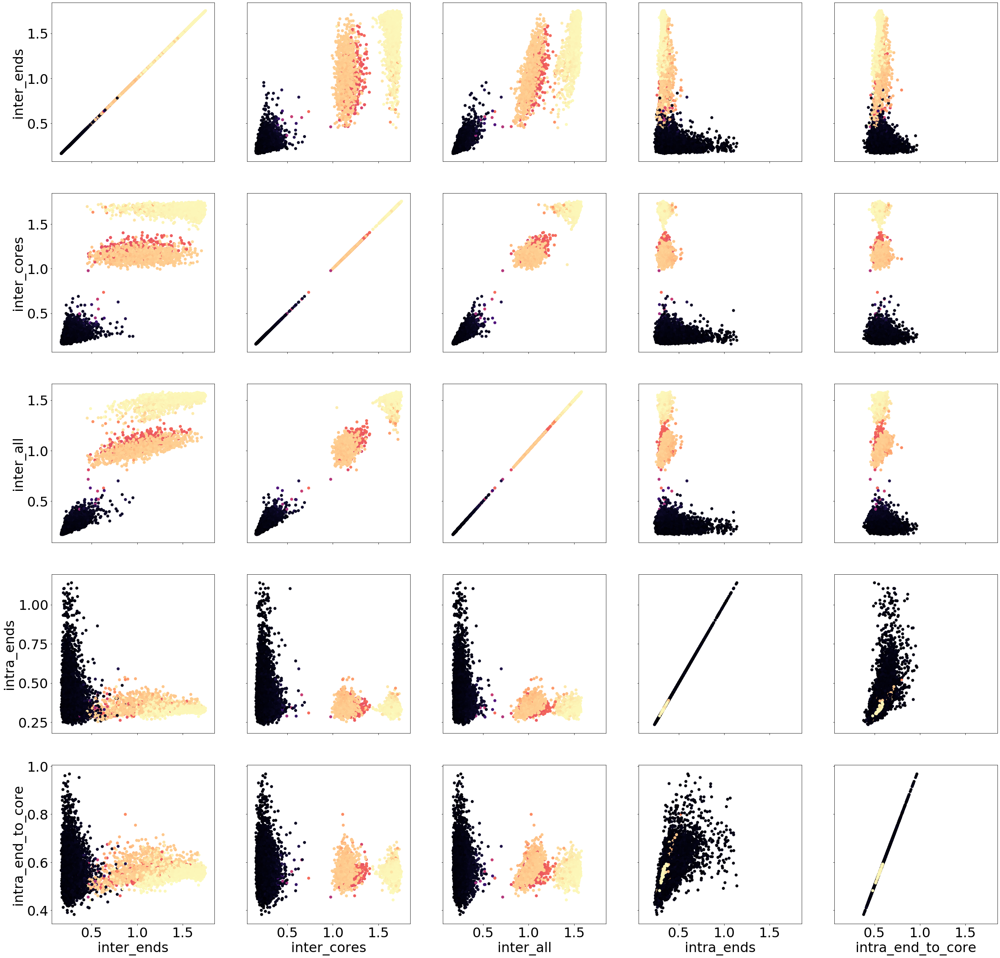

In [11]:
plot_subs(df, bp_match_dict, '1st_EF')

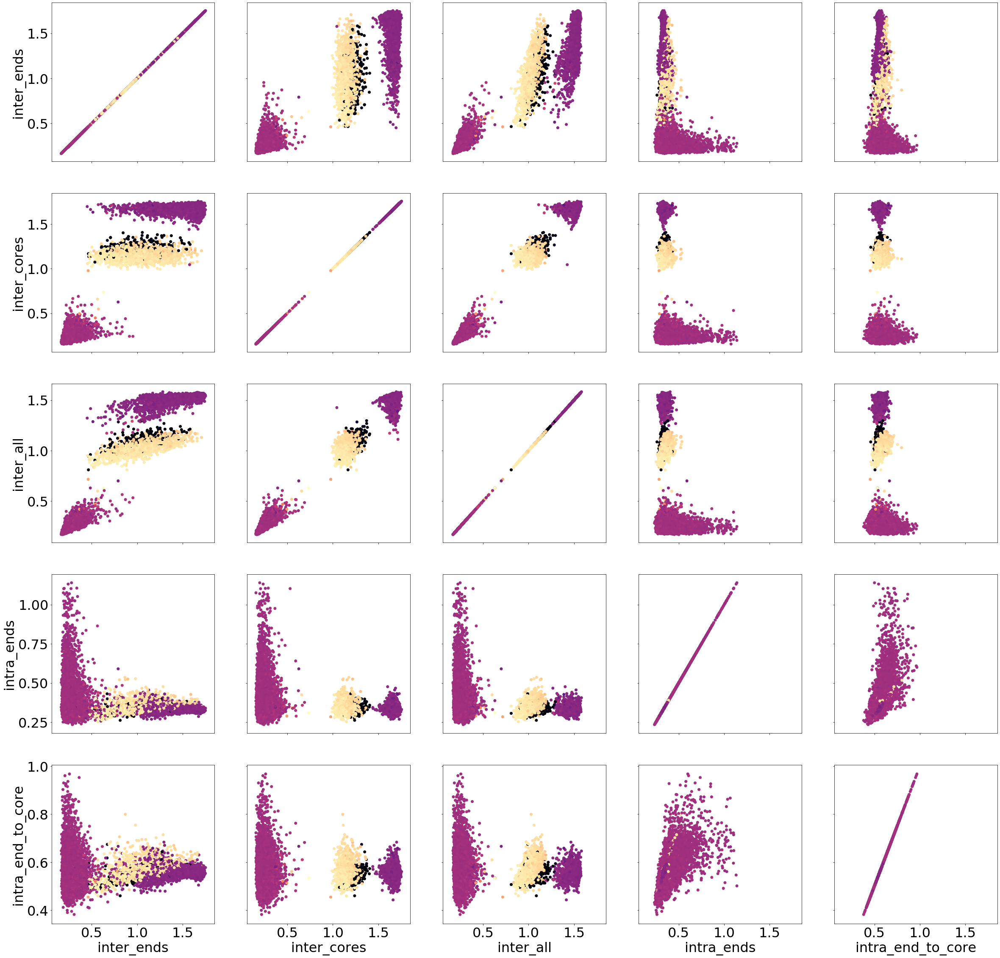

In [12]:
plot_subs(df, bp_match_dict, '2nd_EF')

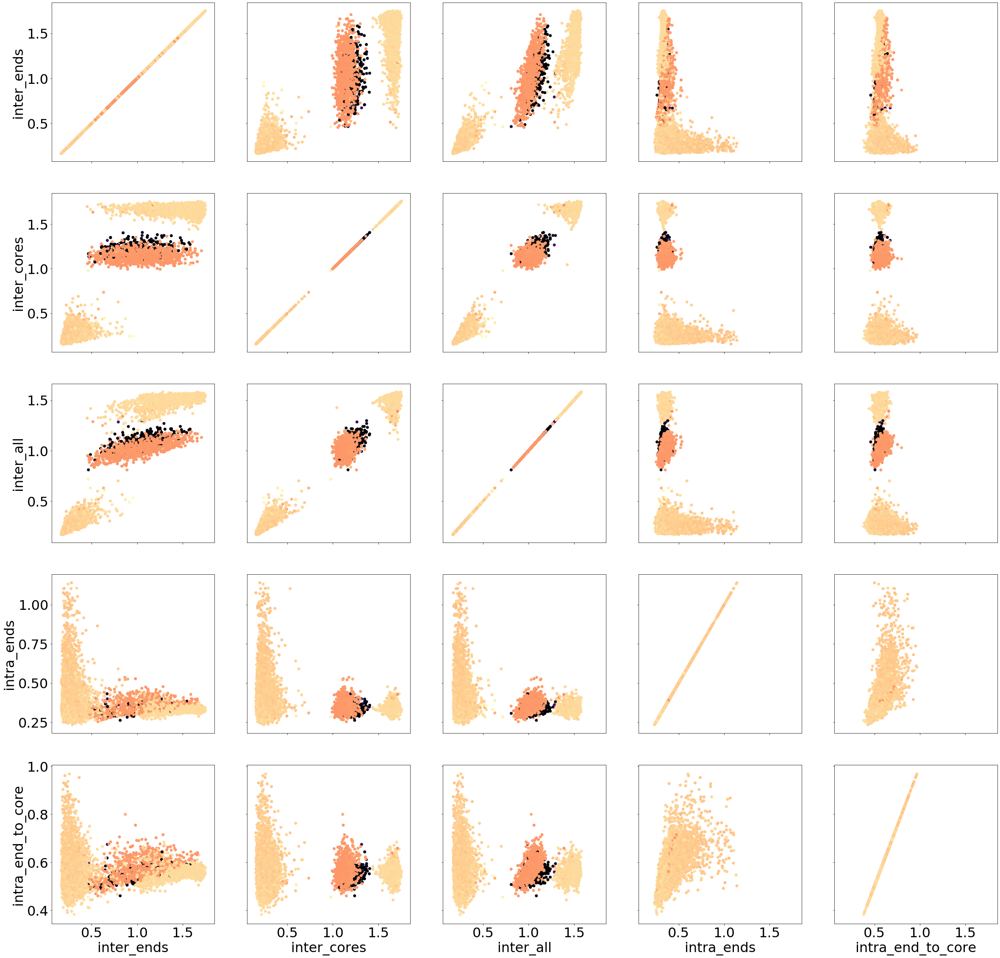

In [13]:
plot_subs(df, bp_match_dict, '3rd_EF')

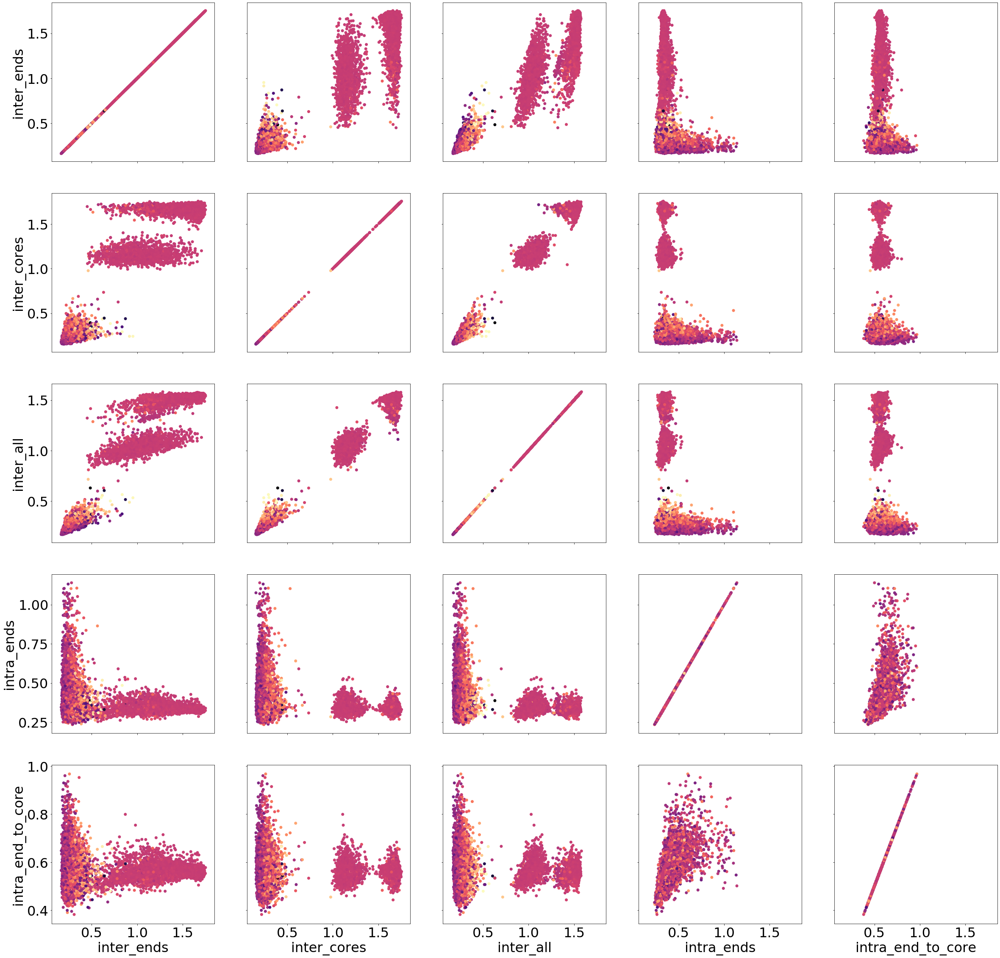

In [14]:
plot_subs(df, bp_match_dict, '4th_EF')

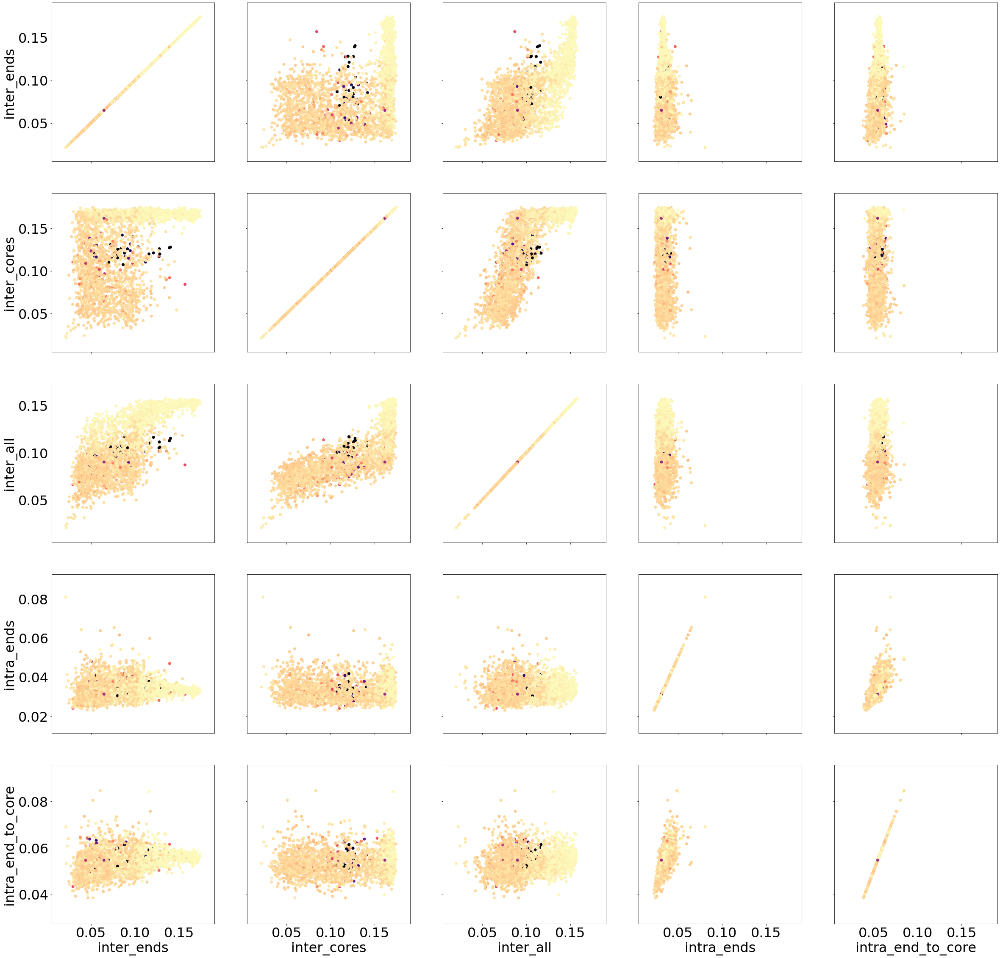

In [26]:
plot_subs(df, bp_match_dict, '5th_EF')

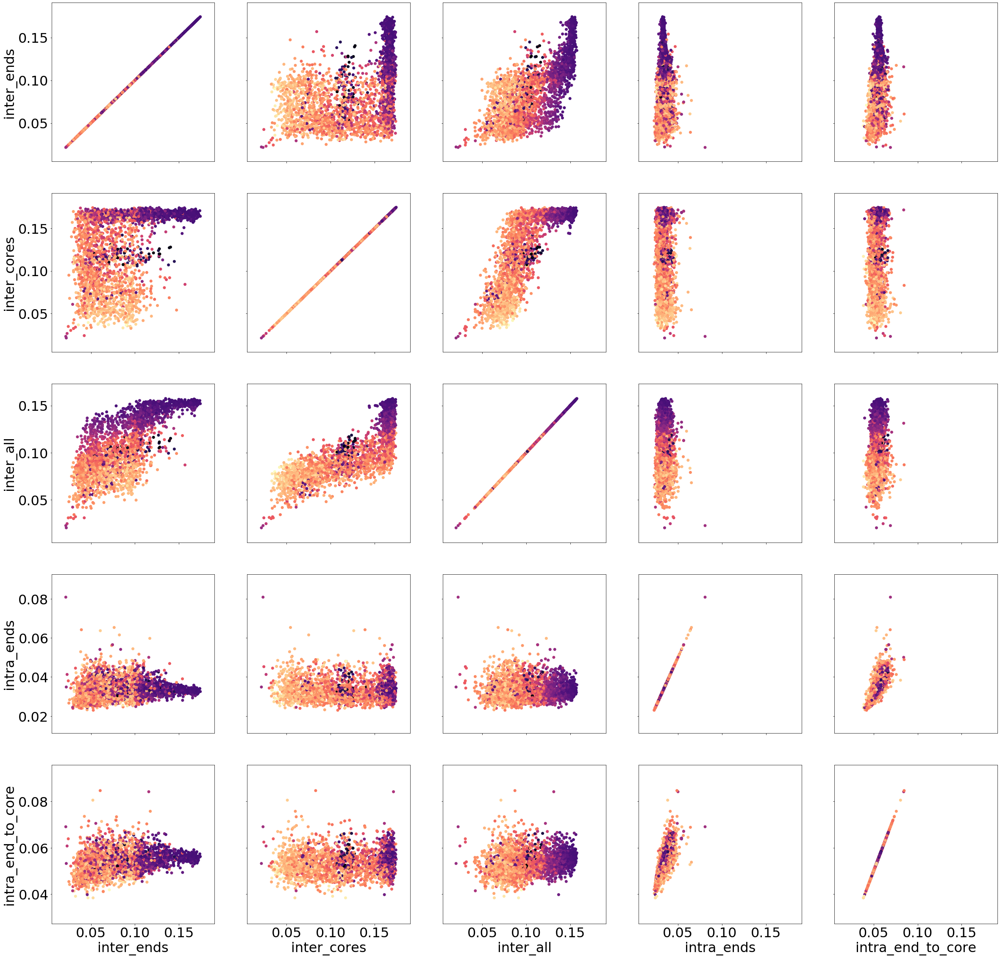

In [27]:
plot_subs(df, bp_match_dict, '6th_EF')

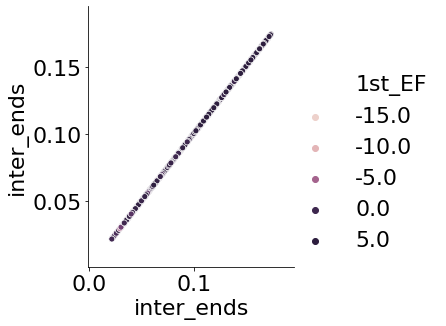

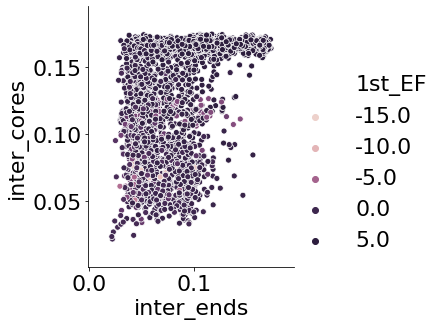

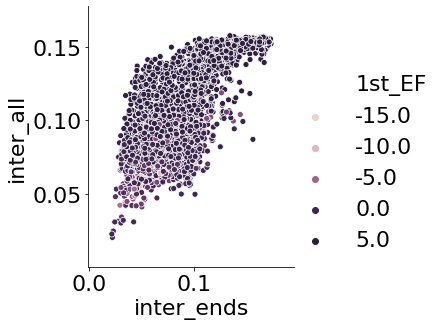

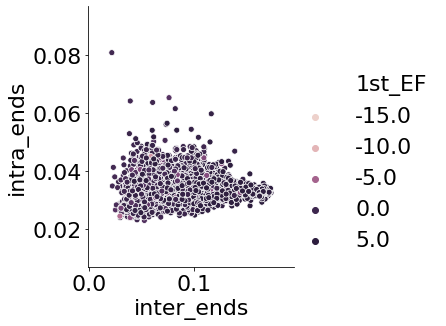

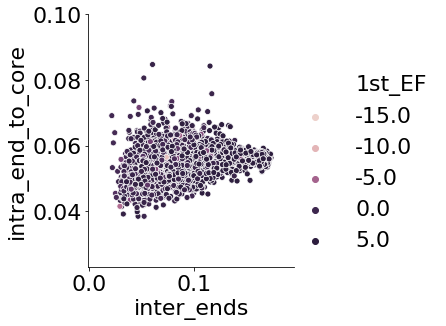

...

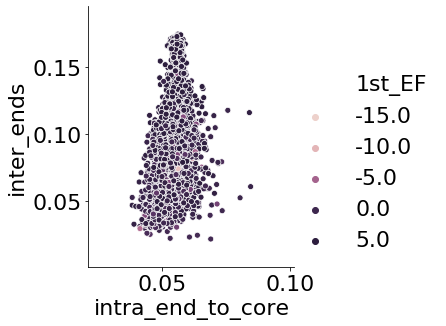

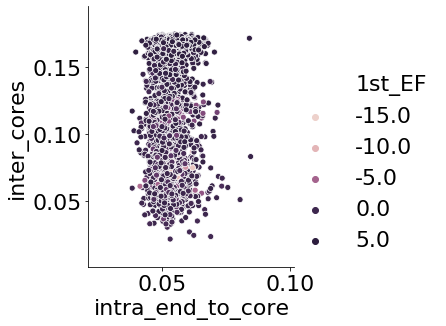

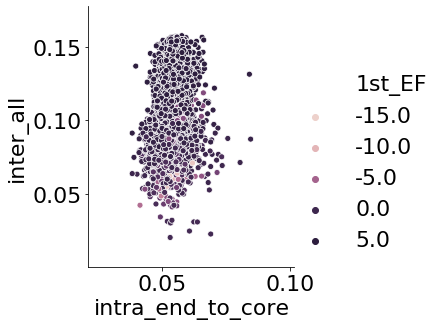

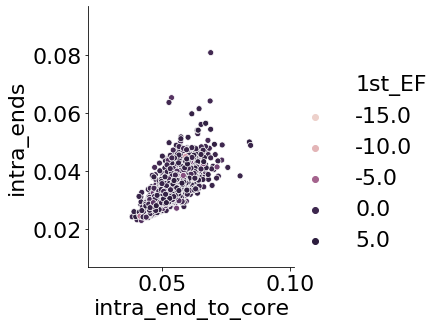

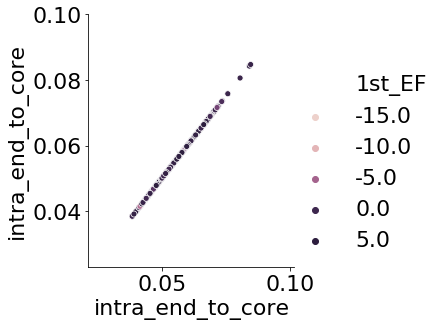

In [18]:
for k_i in bp_match_dict:
    for k_j in bp_match_dict:
        
        sns.relplot(data = df,
                    x = k_i, 
                    y = k_j, 
                    hue = "1st_EF",
                    )